# Create and Find Images with Stable Diffusion and Florence Vector Search

Welcome to our notebook on Synthetic Image Creation and Search. In this notebook, we'll guide you through a comprehensive demonstration of clustering and searching for images semantically, using embeddings derived from the Florence Foundation model. The techniques presented here are incredibly versatile and can be applied in the following ways:

To discover or group images by visual similarity, enabling intuitive organization and retrieval of visual data.
To locate specific images using a text description, a feature particularly beneficial when dealing with large image databases.
To exemplify these applications, we're utilizing images from three distinct categories: 1) Female Individuals, 2) Male Individuals, and 3) Animals.

If you have your own collection of images representing different classes similar to the examples above, these can be organized in subfolders within the `./source` directory. It is recommended that the names of these subfolders accurately reflect the nature of the classes they represent.

However, if you're starting without a pre-existing set of images, don't fret! The first section of this notebook is dedicated to guiding you through the process of creating synthetic images using the Stable Diffusion technique. By the end of this notebook, you will not only have a collection of synthetic images but also the ability to effectively manage and search through them using the power of the Florence Foundation model.

## General Imports and Helper Functions

In [1]:
import sys
sys.path.insert(0, '..')

import os
import matplotlib.pyplot as plt
from PIL import Image, ImageOps
import math
import requests
from io import BytesIO

from utils import show_images

from bokeh.plotting import figure, show, output_notebook
from bokeh.models import ColumnDataSource

# Part I: Create Synthetic Images of Men, Women and Animals
__Note:__ This is an optional step if you don't want to bring your own sample images.

In [2]:
from diffusers import StableDiffusionPipeline, AutoencoderKL,  DPMSolverMultistepScheduler
import torch
import random
from IPython.display import display

In [3]:
# Central variables for image generation:

classes = ['man', 'woman', 'animal'] # classes to generate 
root = './genimages' # root folder for generated images
images_per_class = 100

Feel free to experiment with different models like `Realistic Vision 2.0` or `Stable Diffusion 2.1`. We have generated images of individuals using the Realistic Vision model. For animals, we have chosen Stable Diffusion 2.1.

In [ ]:
# for using Realistic Vision 2.0
# pipe = StableDiffusionPipeline.from_pretrained("SG161222/Realistic_Vision_V2.0",
#                                                torch_dtype=torch.float16,
#                                                )


# for using Stable Diffusuin 2.1
pipe = StableDiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-2-1",
                                              # torch_dtype=torch.float16,
                                               )

pipe.to('cuda')

In [ ]:
def generate_prompt(classname):

    shot = random.choice(['Long shot', 'Full shot', 'Medium shot', 'Close up'])
    medium = random.choice(['raw photo'])
    age = random.choice(['young', 'middle aged', 'senior']) 
    origin = random.choice(['German', 'European', 'English', 'Spanish', 'American', 'African', 'Asian'])
    dressed = random.choice(['casually', 'business formally', 'black tied'])
    male_role = random.choice(['businessman', 'male tourist', 'man']) 
    female_role = random.choice(['businesswoman', 'female tourist', 'woman']) 
    doing = random.choice(['walking in a busy city', 'in a business meeting', 'eating in a restaurant', 'talking to coworkers', 'bicycling', 'driving a a convertible', 'walking in a park'])
    animal_scene = random.choice([
        'lion running in the steppe', 
        'eagle flying in the sky',
        'dolphins leaping in the ocean',
        'a herd of elephants marching through the savannah',
        'monkeys swinging through the rainforest',
        'penguins waddling on the Antarctic ice',
        'a kangaroo hopping in the Australian outback',
        'a polar bear hunting in the Arctic',
        'a snake slithering in the desert',
        'a group of ants marching in the forest',
        'a deer grazing in the meadow',
        'a colony of bats flying out of a cave',
        'a wolf pack howling at the moon in the tundra',
        'a tortoise slowly walking on a sunny beach',
        'a squirrel darting up a tree in the park',
        'an octopus swimming in the deep sea',
        'a butterfly fluttering in a blooming garden'
    ])

    if classname == 'man':
        prompt = f'{shot} {medium} of {age} {dressed} dressed {origin} {male_role} {doing}'
    if classname == 'woman':
        prompt = f'{shot} {medium} of {age} {dressed} dressed {origin} {female_role} {doing}'
    if classname == 'animal':
        prompt = f'{shot} {medium} of {animal_scene}'

    return prompt

def generate_images(prompt, num_images=1):

    suffix = ", (high detailed skin:1.2), 8k uhd, dslr, high quality, film grain, real-world, unedited, photorealistic, Fujifilm XT3, natural, authentic"
    negative_prompt = '(semi-realistic, cgi, 3d, render, sketch, cartoon, drawing, anime:1.4), text, close up, cropped, out of frame, worst quality, low quality, jpeg artifacts, ugly, duplicate, morbid, mutilated, extra fingers, mutated hands, poorly drawn hands, poorly drawn face, mutation, deformed, blurry, dehydrated, bad anatomy, bad proportions, extra limbs, cloned face, disfigured, gross proportions, malformed limbs, missing arms, missing legs, extra arms, extra legs, fused fingers, too many fingers, long neck'

    images = pipe(prompt=prompt + suffix,
                negative_prompt=negative_prompt,
                height=512,
                width=768,
                guidance_scale=7.5,
                num_inference_steps=50,
                num_images_per_prompt=num_images,
                ).images
    
    return images

for classname in classes:
    image_path = os.path.join(root, classname)
    # create the directory if it doesn't exist
    if not os.path.exists(image_path):
        os.makedirs(image_path)

    for image_idx in range(images_per_class):
        prompt = generate_prompt(classname)
        # print(prompt)
        image = generate_images(prompt)[0]

        rand_num = random.randint(100000, 999999)
        image.save(os.path.join(image_path, f"image-{rand_num}.png"))

## Review Samples of generated Images

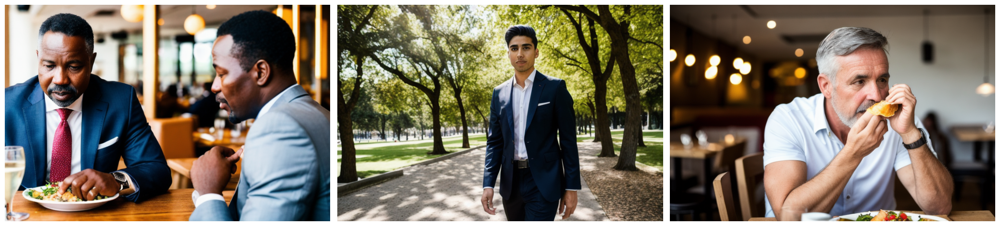

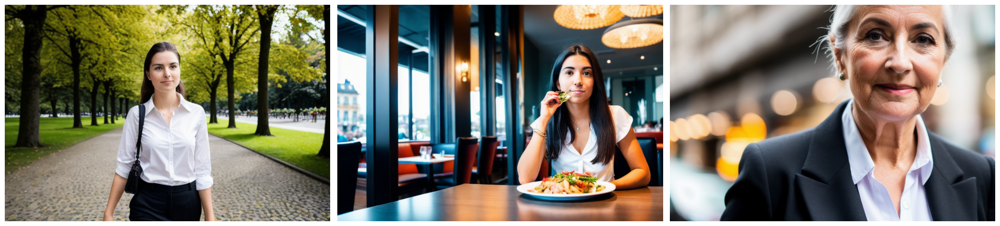

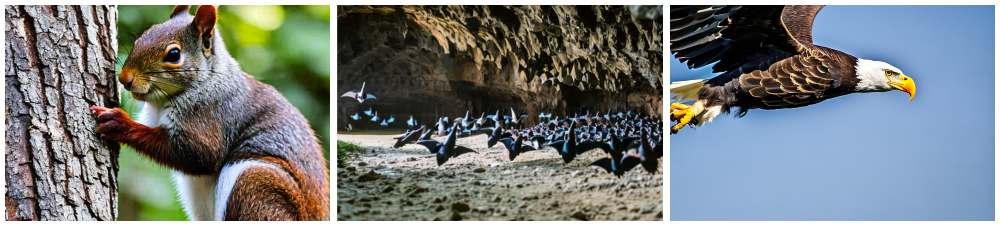

In [25]:
samples_per_class = 3

for classname in classes:
    image_path = os.path.join(root, classname)
    image_list = [os.path.join(image_path, image) for image in os.listdir(image_path) if image.endswith('.png')]

    show_images(images=image_list[:samples_per_class], cols=3, source='local')

# Part II: Generate Image Embeddings for Clustering and Image Search

In [4]:
from sklearn.manifold import TSNE
from dotenv import load_dotenv
import json

import pandas as pd
import numpy as np
from tenacity import retry, stop_after_attempt, wait_random_exponential

In [5]:
# Central variables image search:

load_dotenv('../.env')

# Azure Computer Vision
key = os.getenv("azure_cv_key")
endpoint = os.getenv("azure_cv_endpoint")

image_root = './source/'

In [6]:
@retry(wait=wait_random_exponential(min=1, max=60), stop=stop_after_attempt(6)) # automatic retry in case of a failing API call
def get_embedding(imagefile):
    """
    Get embedding from an image using Azure Computer Vision 4
    """
    # settings
    model = "?api-version=2023-02-01-preview&modelVersion=latest"
    url = endpoint + "/computervision/retrieval:vectorizeImage" + model
    headers = {
        "Content-type": "application/octet-stream",
        "Ocp-Apim-Subscription-Key": key,
    }

    # Read the image file
    with open(imagefile, "rb") as f:
        data = f.read()

    # Sending the requests
    r = requests.post(url, data=data, headers=headers)
    results = r.json()
    embeddings = results['vector']

    return embeddings

def get_text_embedding(text):
    """
    Get embedding from text using Azure Computer Vision 4
    """

    # settings
    #options = "&features=caption,tags"
    model = "?api-version=2023-02-01-preview&modelVersion=latest"
    url = endpoint + "/computervision/retrieval:vectorizeText" + model # + options
    headers = {
        "Content-type": "application/json",
        "Ocp-Apim-Subscription-Key": key,
    }

    data = {
        "text": text
    }

    # Sending the requests
    r = requests.post(url, data=json.dumps(data), headers=headers)
    results = r.json()
    embeddings = results['vector']

    return embeddings

def get_cosine_similarity(vector1, vector2):
    """
    Calculate cosine similarity of two embeddings vectors
    """
    dot_product = sum(a*b for a, b in zip(vector1, vector2))
    magnitude1 = math.sqrt(sum((val*val) for val in vector1))
    magnitude2 = math.sqrt(sum((val*val) for val in vector2))
    return dot_product / (magnitude1 * magnitude2)

## Create a dataframe of image name, class and embeddings

In [7]:
# optionally reload existing dataframe
df = pd.read_pickle('men-women-animals-embeddings.pkl')

In [6]:
df = pd.DataFrame(columns=['file', 'class', 'embedding'])

idx = 0
for root, dirs, files in os.walk(image_root):
    for dir in dirs:
        print(f"Subfolder: {dir}")
        subdir = os.path.join(root, dir)
        for file in os.listdir(subdir):
            if file.endswith('.png') or file.endswith('.jpg'):
                # print(f"Image file: {file}")
                full_path = os.path.join(image_root, dir, file)

                embedding = get_embedding(imagefile=full_path)

                row = [full_path, dir, embedding]
                df.loc[idx] = row
                idx += 1

# optionally save new dataframe for later reuse. Pickle format selcted to preserve embeddings data type
# df.to_pickle('./men-women-animals-embeddings.pkl')

Subfolder: animals
Subfolder: women
Subfolder: men


In [8]:
display(df.sample(6))

,file,class,embedding
116,./source/men/Picture112.jpg,men,"[0.44702148, -5.59375, 1.0351562, 1.9580078, 2..."
94,./source/animals/Picture202.jpg,animals,"[-3.4042969, -0.75, 0.04397583, -1.28125, -0.3..."
37,./source/women/Picture94.jpg,women,"[-0.7451172, 0.6713867, 2.1601562, 0.7290039, ..."
149,./source/men/Picture145.jpg,men,"[-0.62890625, -1.0361328, 1.3544922, 0.1343994..."
101,./source/animals/Picture169.jpg,animals,"[-4.7617188, -0.058044434, -2.2949219, -0.1757..."
90,./source/animals/Picture175.jpg,animals,"[1.4326172, -1.0546875, 0.5234375, -0.8989258,..."


## Reducing embeddings dimensions for 2D visualization

In [9]:
# Convert to a list of lists of floats
matrix = df.embedding.to_list()
matrix = np.array(matrix)

# Create a t-SNE model and transform the data
tsne = TSNE(n_components=2, perplexity=15, random_state=42, init='random', learning_rate=200)
vis_dims = tsne.fit_transform(matrix)
vis_dims.shape

# add t-SNE dimensions to the dataframe
df['dim1of2'] = vis_dims[:,0]
df['dim2of2'] = vis_dims[:,1]

In [10]:
# plot definitions
classes = df["class"].unique()
n_classes = len(classes)

#colors = np.random.randint(0, 255, size=(n_classes,3))
# red, blue, green, yellow, orange, black, white, brown -- rotate 3x
colors = [(255,0,0), (0,0,255), (0,255,0), (255, 255, 0), (255, 165, 0), (0, 0, 0), (255, 255, 255), (165, 42, 42)] * 3
# clip the colors to the number of classes
colors = colors[:n_classes]

border_color = {k:v for (k,v) in zip(classes, colors)}

thumbnail_size = (250, 250) 
border_size = 20

In [11]:
# prepare data to plot
image_data = []

for index, row in df.iterrows():

    with Image.open(row["file"]) as img:

        # Resize the image to the thumbnail size
        img.thumbnail(thumbnail_size)

        # Convert the images to RGBA format
        img = img.convert('RGBA')

        # Add the border representing the class of the image
        img = ImageOps.expand(img, border = border_size, fill = tuple(border_color[row["class"]]))

        # Flip the image array vertically
        img = np.flipud(np.array(img))

        # Adjust the dims of the image to match bokeh's requirement
        img = img.view("uint32").reshape(img.shape[:2])

        # Add the image to the list
        image_data.append(img)

x = list(df['dim1of2'])
y = list(df['dim2of2'])

## Interactive thumbnail plot
Use the Bokeh mousewheel zoom control to inspect clusters and individual images  

In [ ]:
# Create a ColumnDataSource object
source = ColumnDataSource(data=dict(x = x, y = y, images = image_data))

# Create a figure object
p = figure(width = 1600, height = 1000, title = "t-SNE visualization of Florence image embeddings", tools = "pan,wheel_zoom,reset")

# Add the scatter plot using the image_rgba glyph
p.image_rgba(image = 'images', x = 'x', y = 'y', dw = 0.5, dh = 0.5, source = source)

# Configure Bokeh to display the plot inline in the notebook
output_notebook()

# Show the plot
show(p)

## Image Search by Text Query
Inspect how the similarity score increases when adding more details. Example (provided source images):
- woman painting
- woman painting wall
- woman in colorful dress painting wall orange 

,file,class,similarity
9,./source/women/Picture95.jpg,women,0.420769
48,./source/women/Picture96.jpg,women,0.292047
38,./source/women/Picture63.jpg,women,0.269420
5,./source/women/Picture60.jpg,women,0.269420
11,./source/women/Picture90.jpg,women,0.267420
35,./source/women/Picture84.jpg,women,0.250424
14,./source/women/Picture100.jpg,women,0.233764
26,./source/women/Picture81.jpg,women,0.229608
39,./source/women/Picture73.jpg,women,0.227090


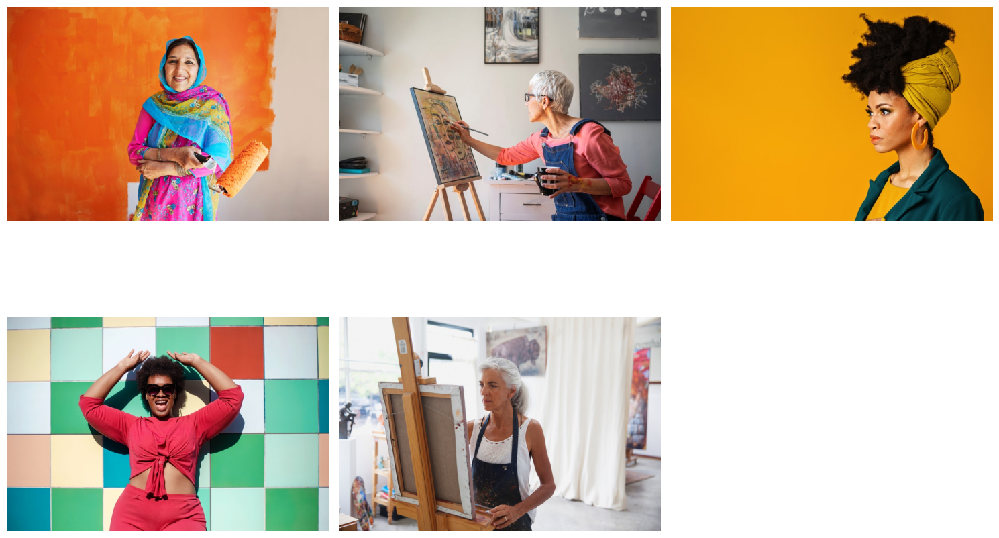

In [13]:
search_term = 'woman in colorful dress painting wall orange'

txt_search_vector = get_text_embedding(search_term)

df['similarity'] = df['embedding'].apply(lambda x: get_cosine_similarity(txt_search_vector, x))

# show top 5 results
sorted_df = df.sort_values(by='similarity', ascending=False)
top_results = sorted_df['file'].head(5).tolist()
display(sorted_df[['file', 'class', 'similarity']].head(9))
show_images(images=top_results, cols=3, source='local')

## Image Search by sample Image

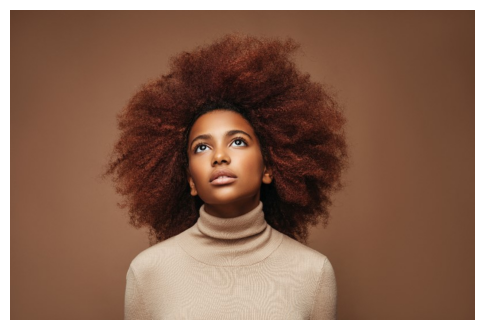

In [26]:
search_img = './findme.jpg'

plt.figure(figsize=(6,6))

img = Image.open(search_img)
plt.imshow(img)
plt.axis('off')

plt.show()

,file,class,similarity
19,./source/women/Picture2.jpg,women,0.967153
30,./source/women/Picture1.jpg,women,0.873458
38,./source/women/Picture63.jpg,women,0.787672
36,./source/women/Picture91.jpg,women,0.763266
4,./source/women/Picture55.jpg,women,0.754357
10,./source/women/Picture82.jpg,women,0.707005
46,./source/women/Picture77.jpg,women,0.698110
39,./source/women/Picture73.jpg,women,0.696641
20,./source/women/Picture79.jpg,women,0.687336


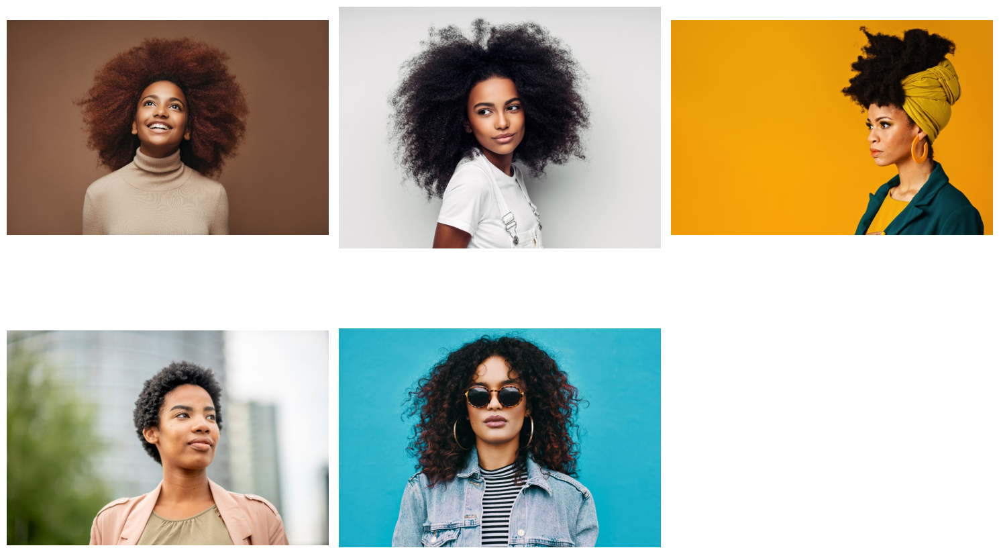

In [27]:
img_search_vector = get_embedding(imagefile=search_img)

df['similarity'] = df['embedding'].apply(lambda x: get_cosine_similarity(img_search_vector, x))

sorted_df = df.sort_values(by='similarity', ascending=False)

# show top 5 results
top_results = sorted_df['file'].head(5).tolist()
display(sorted_df[['file', 'class', 'similarity']].head(9))
show_images(images=top_results, cols=3, source='local')

## Image Search by sample Image using different angles, to check performance

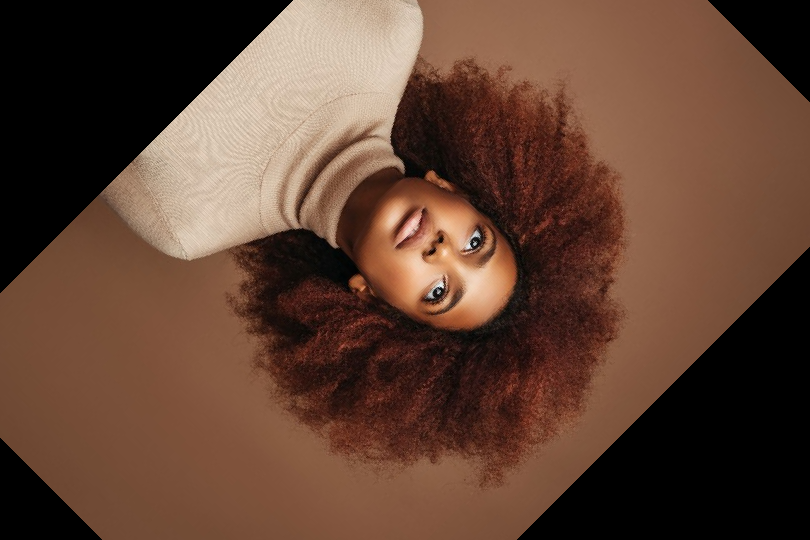

,file,class,similarity
19,./source/women/Picture2.jpg,women,0.817545
30,./source/women/Picture1.jpg,women,0.799132
38,./source/women/Picture63.jpg,women,0.722710
36,./source/women/Picture91.jpg,women,0.649070
20,./source/women/Picture79.jpg,women,0.643580
4,./source/women/Picture55.jpg,women,0.634736
39,./source/women/Picture73.jpg,women,0.618185
26,./source/women/Picture81.jpg,women,0.612513
41,./source/women/Picture80.jpg,women,0.592974


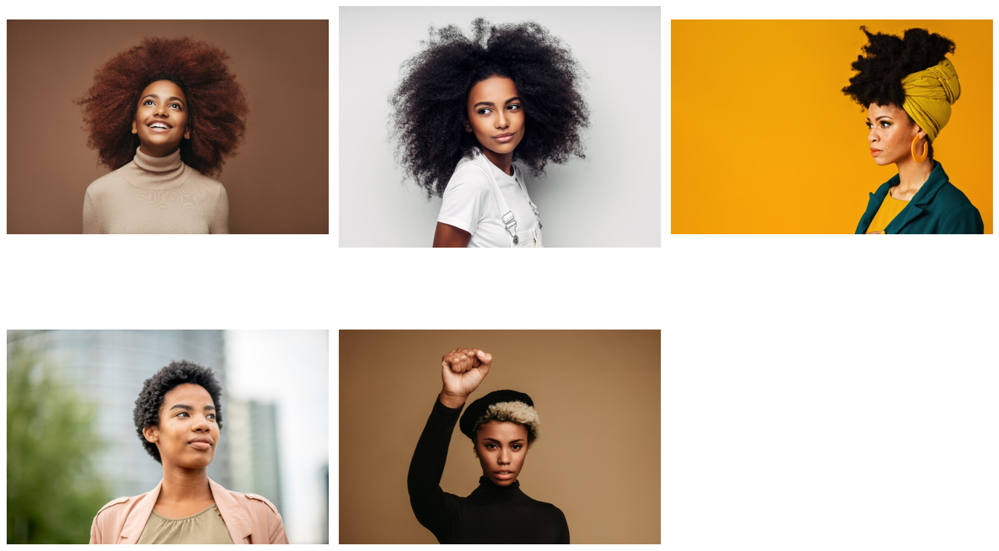

In [32]:
# define angle to rotate
angle = 225
search_img_rotated = './findme_rotated.jpg'

# rotate and save the image
rotated_image = img.rotate(angle)
rotated_image.show()
rotated_image.save(search_img_rotated)

# get the embeddings and search
img_search_vector = get_embedding(imagefile = search_img_rotated)
df['similarity'] = df['embedding'].apply(lambda x: get_cosine_similarity(img_search_vector, x))
sorted_df = df.sort_values(by='similarity', ascending=False)

# show top 5 results
top_results = sorted_df['file'].head(5).tolist()
display(sorted_df[['file', 'class', 'similarity']].head(9))
show_images(images=top_results, cols=3, source='local')